# Imports and Functions

In [7]:
#Imports
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import cv2
from PIL import Image
from osgeo import gdal

import os
import glob
import random

from skimage.metrics import structural_similarity as ssim
from sewar.full_ref import rmse, psnr, uqi, ergas, scc, rase, sam, vifp

In [8]:
#gloabl variables
global channels 
channels = ['Coastal Aerosol','Blue','Green',
                 'Red','Red Edge 1','Red Edge 2',
                'Red Edge 3','NIR','Red Edge 4',
                 'Water Vapour','SWIR 1','SWIR 2']

In [9]:
# Functions
def get_rgb(img):
    """Return normalized RGB channels from sentinal image"""
    
    rgb_img = img[:, :, [3,2,1]]
    rgb_normalize = np.clip(rgb_img/10000, 0, 0.3)/0.3
    
    return rgb_normalize


def load_test(path):
    """Returns sentinel image, RGB image, and label"""
    img = gdal.Open(path).ReadAsArray()
    stack_img = np.stack(img, axis=-1)
    rgb_img = get_rgb(stack_img)
    
    label_path = path.replace("images", "labels").replace("image", "label")
    label = gdal.Open(label_path).ReadAsArray()
    
    return stack_img, rgb_img, label

    
# Define the channel_filter function
def channel_filter(img, c=0):
    """Returns given channel from image"""
    img = np.array(img)
    c_img = img[:, :, c]
    return c_img


def plot_channels(img,invert=False,path=None):
    
    """Plot all channels of a given image"""
    
    global channels

    fig, axs = plt.subplots(3,4,figsize=(15,10))

    index = 0
    for i in range(3):
        for j in range(4):
            c_img = channel_filter(img,c=index)
            if invert:
                c_img = 255-c_img

            axs[i,j].imshow(c_img,cmap='gray')
            axs[i,j].set_title(channels[index],size=20)
            axs[i,j].set_xticks([])
            axs[i,j].set_yticks([])

            index +=1

    if path != None:
        plt.savefig(path, bbox_inches='tight')

# Get input and labels

In [10]:

# Main code
test_path = glob.glob("../data/SWED/test/images/*")
print(test_path[0])
print(len(test_path))

# Load all images
input_images = []
rgb_images = []
labels = []

for path in test_path:
    try:
        img, rgb_img, label = load_test(path)
        input_images.append(img)
        rgb_images.append(rgb_img)
        labels.append(label)
    except Exception as e:
        print(f"Error with image {path}: {e}")

# Apply Canny to binary maps
canny_input = [np.uint8(img * 255) for img in labels]
edge_reference = [cv2.Canny(img, threshold1=100, threshold2=200) for img in canny_input]

# Display the first image path and the total number of images
print(f"First image path: {test_path[0]}")
print(f"Total number of images: {len(test_path)}")

../data/SWED/test/images/S2A_MSIL2A_20200215T082021_N0214_R121_T36SXA_20200215T110825_image_0_0.tif
1
First image path: ../data/SWED/test/images/S2A_MSIL2A_20200215T082021_N0214_R121_T36SXA_20200215T110825_image_0_0.tif
Total number of images: 1


In [11]:
#Sense checks
print("Lengths:",len(input), len(labels), len(rgb), len(edge_reference))

print("Input:", np.min(input[0]),np.max(input[0]))
print("RGB:", np.min(rgb[0]),np.max(rgb[0]))
print(len(rgb[0][0][0]))
print("Labels:",np.min(labels[0]),np.max(labels[0]))
print("Edge reference:",np.min(edge_reference),np.max(edge_reference))


Lengths: 1 1 1 1
Input: 0 8760
RGB: 0.009333333333333334 1.0
3
Labels: 0 1
Edge reference: 0 255


Random index: 0
[<AxesSubplot: > <AxesSubplot: > <AxesSubplot: > <AxesSubplot: >]


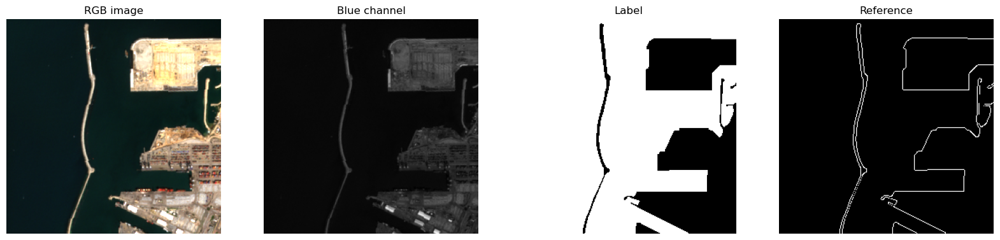

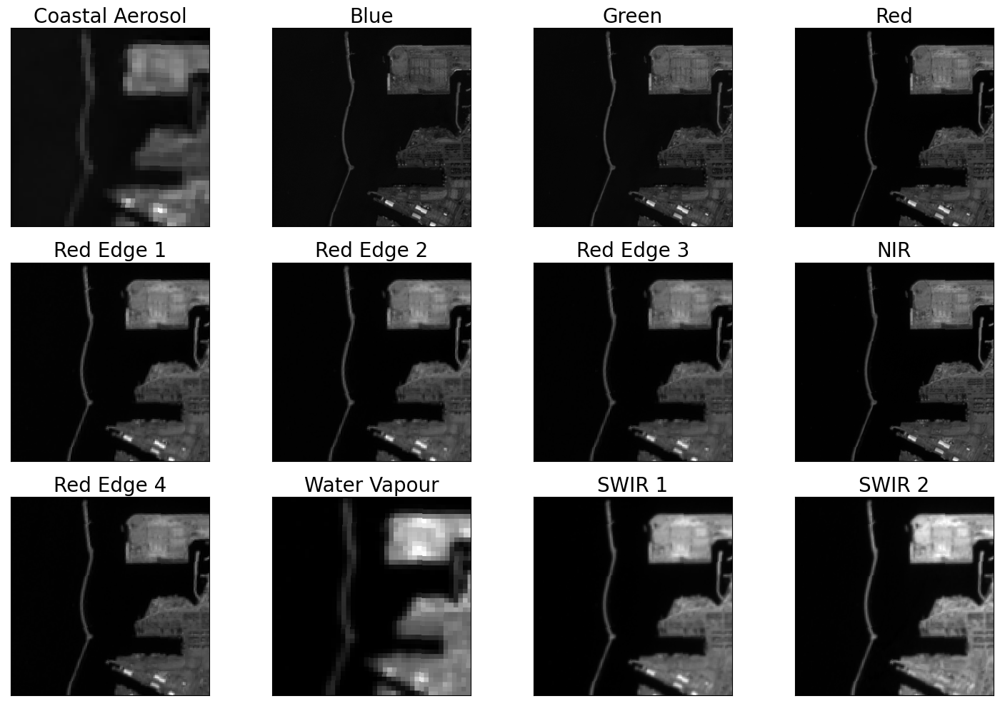

In [12]:
# Explore an image example

# Generate a random integer within the range of your dataset
rint = random.randint(0, len(rgb) - 1)

# Create a figure with 4 subplots
fig, axs = plt.subplots(1, 4, figsize=(20, 5))

# Print the generated random integer and the axes for debugging
print(f"Random index: {rint}")
print(axs)

# Plot the RGB image
axs[0].imshow(rgb[rint])
axs[0].set_title("RGB image")
axs[0].axis("off")

# Plot the blue channel
axs[1].imshow(input[rint][:, :, 1], cmap="gray")
axs[1].set_title("Blue channel")
axs[1].axis("off")

# Plot the label
axs[2].imshow(labels[rint], cmap="gray")
axs[2].set_title("Label")
axs[2].axis("off")

# Plot the edge reference
axs[3].imshow(edge_reference[rint], cmap="gray")
axs[3].set_title("Reference")
axs[3].axis("off")

# Plot all channels
plot_channels(input[rint])

# Display the figure
plt.tight_layout()
plt.show()

# Edge detection

In [13]:
def preprocess(img_input, toggle=[True, True, False]):
    """Preprocess image for edge detection
    toggle: [Equalized histogram, Gaussian blur, Morphological closing]
    """
    img = np.array(img_input, dtype=np.uint8)

    # Iterate over bands
    for i in range(12):
        img_i = img[:, :, i]

        # Scale bands between 0 and 255
        img[:, :, i] = cv2.normalize(img_i, None, 0, 255, cv2.NORM_MINMAX)

        # Equalized histogram
        if toggle[0]:
            img_i = cv2.equalizeHist(img[:, :, i])
            img[:, :, i] = img_i

        # Gaussian blur
        if toggle[1]:
            kernel = (5, 5)
            img_i = cv2.GaussianBlur(img[:, :, i], kernel, 0)
            img[:, :, i] = img_i

        # Morphological closing
        if toggle[2]:
            kernel = np.ones((5, 5), np.uint8)
            img_i = cv2.morphologyEx(img[:, :, i], cv2.MORPH_CLOSE, kernel)
            img[:, :, i] = img_i

    return img


def canny_ed(img_input, threshold1=100, threshold2=200):
    """Apply canny edge detection to image"""
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    for i in range(img.shape[2]):
        edges[:, :, i] = cv2.Canny(img[:, :, i], threshold1, threshold2)

    return edges

def scharr_ed(img_input):
    """Apply scharr edge detection to image"""
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    for i in range(img.shape[2]):
        schx = cv2.Scharr(img[:, :, i], cv2.CV_8U, 1, 0)
        schy = cv2.Scharr(img[:, :, i], cv2.CV_8U, 0, 1)
        edges[:, :, i] = schx + schy

    return edges

def sobel_ed(img_input):
    """Apply sobel edge detection to image"""
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    for i in range(img.shape[2]):
        sobelx = cv2.Sobel(img[:, :, i], cv2.CV_8U, 1, 0, ksize=5)
        sobely = cv2.Sobel(img[:, :, i], cv2.CV_8U, 0, 1, ksize=5)
        edges[:, :, i] = sobelx + sobely

    return edges    

def prewitt_ed(img_input):
    """Apply prewitt edge detection to image"""
    img = np.array(img_input, dtype=np.uint8)
    edges = np.zeros_like(img)

    kx = np.array([[1, 1, 1], [0, 0, 0], [-1, -1, -1]]) 
    ky = np.array([[-1, 0, 1], [-1, 0, 1], [-1, 0, 1]])

    for i in range(img.shape[2]):
        prewittx = cv2.filter2D(img[:, :, i], -1, kx)
        prewitty = cv2.filter2D(img[:, :, i], -1, ky)
        edges[:, :, i] = prewittx + prewitty

    return edges

# Plot all channels for each processed input
def plot_all_channels(input_data, title, path=None):
    fig, axs = plt.subplots(3, 4, figsize=(15, 10))
    for i in range(12):
        ax = axs[i // 4, i % 4]
        ax.imshow(input_data[:, :, i], cmap='gray')
        ax.set_title(f"{title} - Channel {i}")
        ax.axis("off")
    plt.tight_layout()
    if path:
        plt.savefig(path, bbox_inches='tight')
    plt.show()

def rmse(ref_img, img):
    return np.sqrt(np.mean((ref_img - img) ** 2))

def psnr(ref_img, img):
    mse = np.mean((ref_img - img) ** 2)
    if mse == 0:
        return float('inf')
    PIXEL_MAX = 255.0
    return 20 * np.log10(PIXEL_MAX / np.sqrt(mse))

def uqi(ref_img, img):
    # Placeholder function for UQI calculation
    if np.mean(img) == 0:
        return 0
    return np.mean(ref_img) / np.mean(img)

In [14]:
# Preprocess images
preprocess_input = input.copy()
preprocess_input = [preprocess(img,toggle=[True,True,False]) for img in preprocess_input]

# Apply edge detection
canny = [canny_ed(img) for img in preprocess_input]
scharr = [scharr_ed(img) for img in preprocess_input]
sobel = [sobel_ed(img) for img in preprocess_input]
prewitt = [prewitt_ed(img) for img in preprocess_input]

Random index: 0


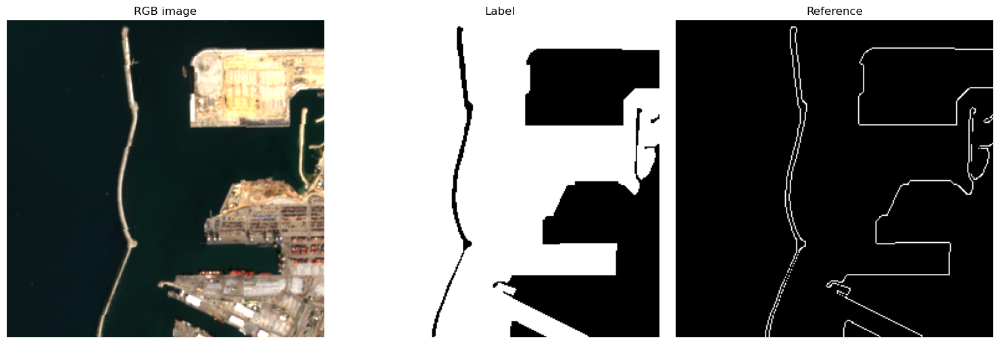

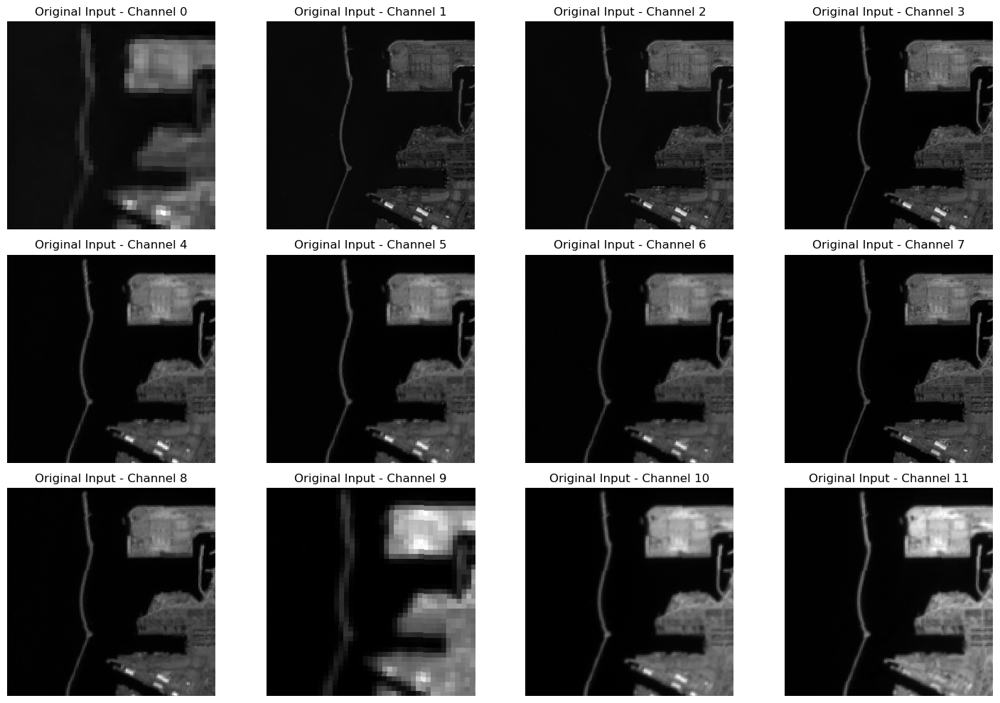

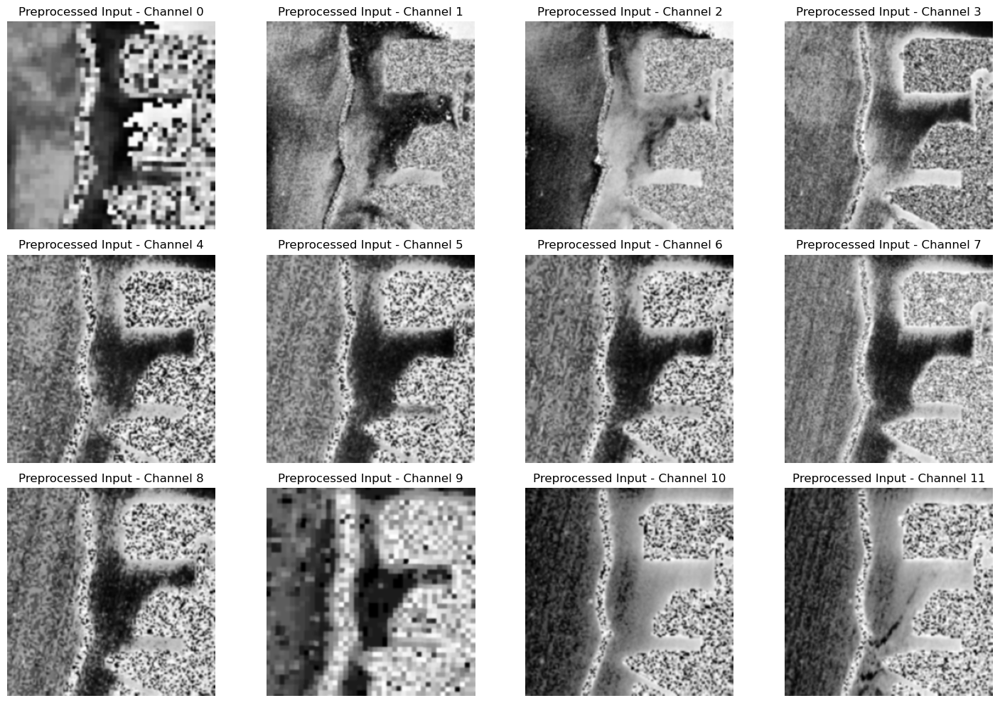

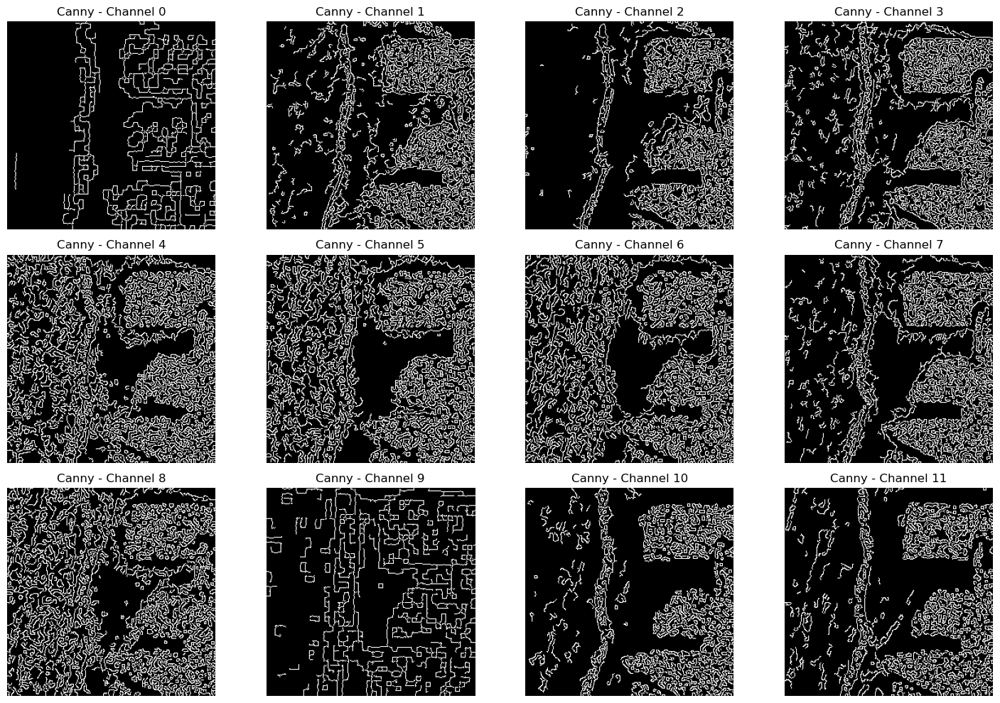

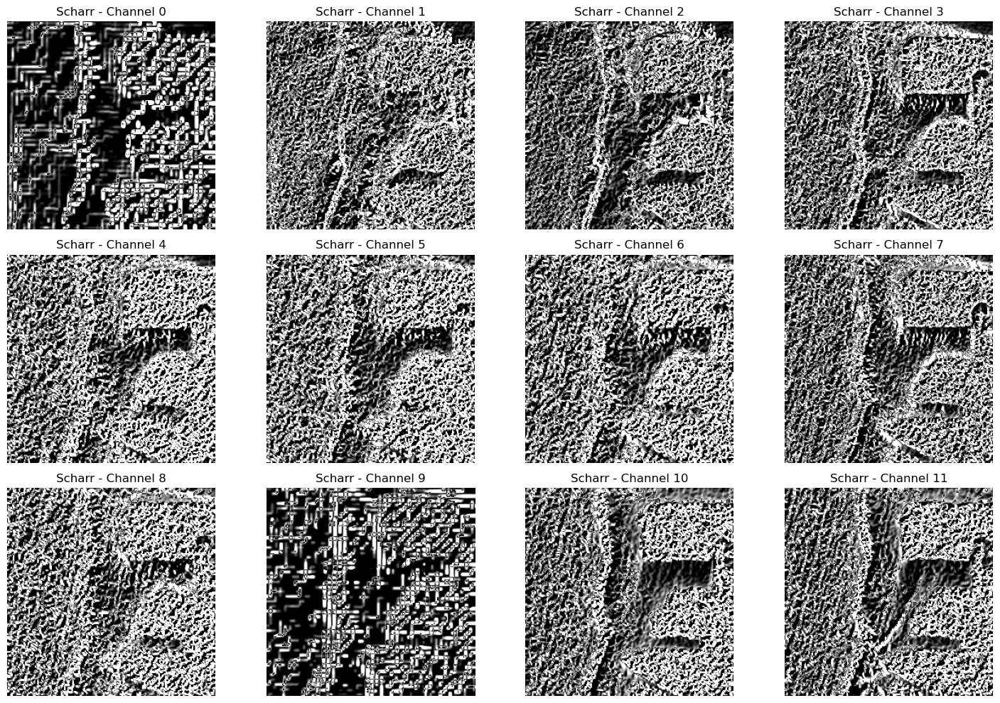

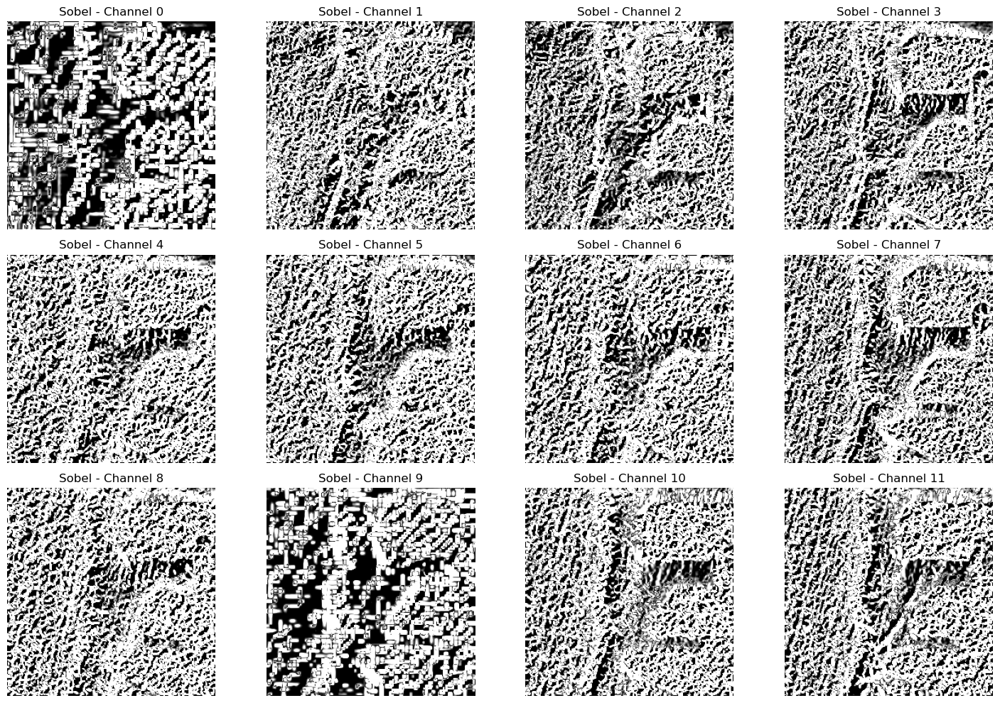

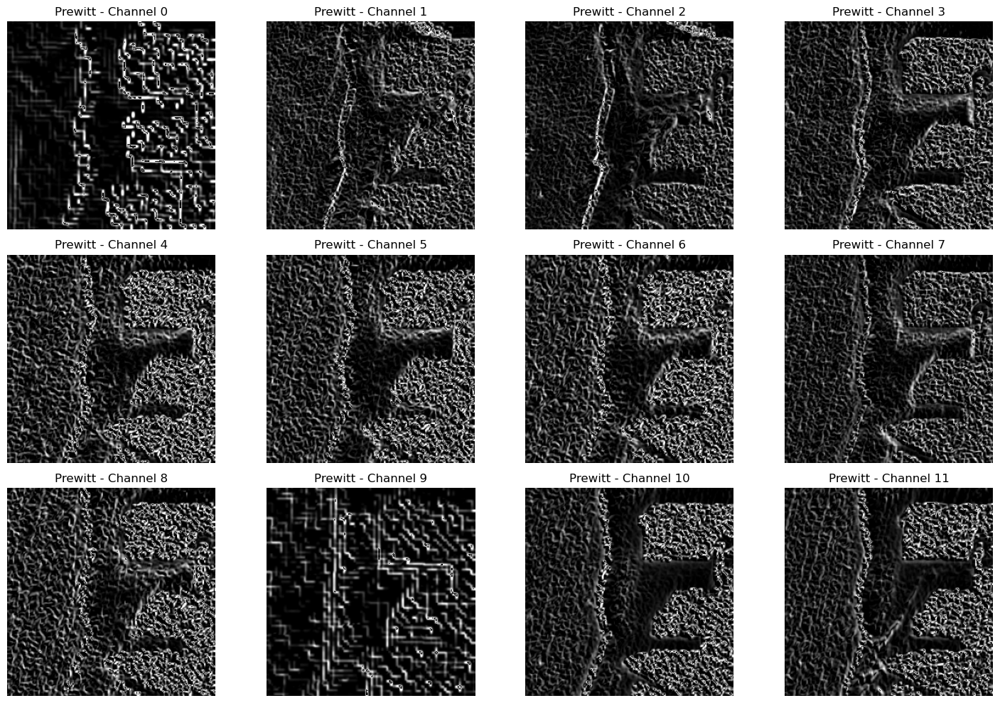

In [15]:
# Visualize edge detection

# Generate a random integer within the valid range of your dataset
rint = random.randint(0, min(len(rgb), len(labels), len(edge_reference), len(input)) - 1)
print(f"Random index: {rint}")

# Create a figure with 3 subplots for RGB, Label, and Reference images
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Plot the RGB image
axs[0].imshow(rgb[rint])
axs[0].set_title("RGB image")
axs[0].axis("off")

# Plot the label
axs[1].imshow(labels[rint], cmap='gray')
axs[1].set_title("Label")
axs[1].axis("off")

# Plot the edge reference
axs[2].imshow(edge_reference[rint], cmap='gray')
axs[2].set_title("Reference")
axs[2].axis("off")

plt.tight_layout()
plt.show()



# Plot all channels for each of the specified data arrays
plot_all_channels(input[rint], "Original Input")
plot_all_channels(preprocess_input[rint], "Preprocessed Input")
plot_all_channels(canny[rint], "Canny")
plot_all_channels(scharr[rint], "Scharr")
plot_all_channels(sobel[rint], "Sobel")
plot_all_channels(prewitt[rint], "Prewitt")

# Calculate Metrics

In [16]:
def metrics(toggle=[True,True,False]):
    """Calculate metrics
    toggle: [Equalized histogram, Gaussian blur, Morphological closing]"""

    preprocess_input = input.copy()
    preprocess_input = [preprocess(img,toggle=toggle) for img in preprocess_input]

    canny = [canny_ed(img) for img in preprocess_input]
    scharr = [scharr_ed(img) for img in preprocess_input]
    sobel = [sobel_ed(img) for img in preprocess_input]
    prewitt = [prewitt_ed(img) for img in preprocess_input]

    rows = []
    for i in range(len(edge_reference)):
        ref_img = edge_reference[i]
        ID = "IMG#{}".format(i)
        
        for j in range(12):

            for method in ['canny','sobel','scharr','prewitt']:

                if method == 'canny':
                    img = canny[i][:,:,j]
                elif method == 'sobel':
                    img = sobel[i][:,:,j]
                elif method == 'scharr':
                    img = scharr[i][:,:,j]
                elif method == 'prewitt':
                    img = prewitt[i][:,:,j]

                rmse_ = rmse(ref_img,img)
                psnr_ = psnr(ref_img,img)
                uqi_ = uqi(ref_img,img)
                ssim_ = ssim(ref_img,img,multichannel=True)
                ergas_ = ergas(ref_img,img)
                scc_ = scc(ref_img,img)
                sam_ = sam(ref_img,img)
                vifp_ = vifp(ref_img,img)

                row = [ID,j+1,method,rmse_,psnr_,uqi_,ssim_,ergas_,scc_,sam_,vifp_]
                rows.append(row)
        
    df_metrics = pd.DataFrame(rows,columns = ['ID',"band","method","rmse","psnr","uqi","ssim","ergas","scc","sam","vifp"])
    return df_metrics

In [17]:
# With equalized histogram, Gaussian blur
df_metrics = metrics()
df_metrics.to_csv("metrics/Metrics_all.csv")
df_metrics.head()

,ID,band,method,rmse,psnr,uqi,ssim,ergas,scc,sam,vifp
0,IMG#0,1,canny,0.311644,58.257619,0.263148,0.486527,361.869653,-0.002533,1.496562,0.005862
1,IMG#0,1,sobel,6.105734,32.416046,0.041248,0.029617,782.550456,0.002571,1.423838,0.005847
2,IMG#0,1,scharr,6.617342,31.717132,0.067392,0.045992,566.811111,0.000109,1.436493,0.006398
3,IMG#0,1,prewitt,7.842205,30.242040,0.155062,0.109042,340.678084,-0.002665,1.468125,0.005042
4,IMG#0,2,canny,0.433910,55.382803,0.118911,0.275376,503.840347,-0.003309,1.455925,0.014306


In [18]:
# With equalized histogram, Morphological closing
df_metrics = metrics(toggle=[True,False,True])
df_metrics.to_csv("metrics/Metrics_morph.csv")
df_metrics.head()

,ID,band,method,rmse,psnr,uqi,ssim,ergas,scc,sam,vifp
0,IMG#0,1,canny,0.357928,57.054879,0.188510,0.373820,415.613050,-0.003095,1.493793,0.004403
1,IMG#0,1,sobel,3.849171,36.423460,0.049403,0.044432,735.318908,-0.001638,1.451140,0.005138
2,IMG#0,1,scharr,2.285500,40.951179,0.096909,0.083567,529.702623,0.002482,1.478253,0.005873
3,IMG#0,1,prewitt,5.166845,33.866295,0.181392,0.126265,367.767499,-0.001065,1.491227,0.004333
4,IMG#0,2,canny,0.313597,58.203374,0.262073,0.470673,364.136674,-0.003450,1.507261,0.016808


In [19]:
# With equalized histogram
df_metrics = metrics(toggle=[True,False,False])
df_metrics.to_csv("metrics/Metrics_hist.csv")
df_metrics.head()

,ID,band,method,rmse,psnr,uqi,ssim,ergas,scc,sam,vifp
0,IMG#0,1,canny,0.359630,57.013693,0.186468,0.371152,417.588408,-0.003091,1.493905,0.004511
1,IMG#0,1,sobel,3.849803,36.422033,0.049196,0.042848,737.171097,-0.003149,1.452482,0.005112
2,IMG#0,1,scharr,2.288022,40.941598,0.096470,0.080808,530.963613,0.002471,1.478844,0.005850
3,IMG#0,1,prewitt,5.189278,33.828665,0.179973,0.124564,369.016821,-0.001056,1.491295,0.004365
4,IMG#0,2,canny,0.601157,52.551052,0.060389,0.007815,698.040284,-0.001812,1.475560,0.004836


In [20]:
# With gaussian blur
df_metrics = metrics(toggle=[False,True,False])
df_metrics.to_csv("metrics/Metrics_blur.csv")
df_metrics.head()

,ID,band,method,rmse,psnr,uqi,ssim,ergas,scc,sam,vifp
0,IMG#0,1,canny,0.317874,58.085711,0.247154,0.497458,369.102977,0.001250,1.482952,0.008235
1,IMG#0,1,sobel,6.396917,32.011389,0.045010,0.032184,738.960457,0.001186,1.414348,0.006404
2,IMG#0,1,scharr,6.443339,31.948584,0.075909,0.058878,532.220483,0.000682,1.423995,0.007390
3,IMG#0,1,prewitt,7.514398,30.612920,0.164882,0.168645,335.924539,-0.000496,1.460004,0.006581
4,IMG#0,2,canny,0.359333,57.020873,0.178721,0.543791,417.243395,-0.002957,1.444020,0.033316


# Visualise metrics

In [21]:
def metric_bar(df, metric, save=False):
    """Plot bar chart of given metric for each edge detection method and band"""
    global channels 

    fig, ax = plt.subplots(1, 1, figsize=(15, 5))

    # Ensure that 'method', 'band', and metric columns are of correct type
    df['method'] = df['method'].astype(str)
    df['band'] = pd.to_numeric(df['band'], errors='coerce')
    df[metric] = pd.to_numeric(df[metric], errors='coerce')

    # Drop rows with NaN values in 'band' or metric columns after conversion
    df = df.dropna(subset=['band', metric])

    # Debug print to check the DataFrame after cleaning
    print(f"Cleaned DataFrame for metric {metric}:\n", df.head())

    # Group by method and band, then calculate mean and standard deviation
    mean = df.groupby(["method", "band"], as_index=False)[metric].mean()
    sd = df.groupby(["method", "band"], as_index=False)[metric].std()

    edge_methods = ["canny", "sobel", "scharr", "prewitt"]
    for i, em in enumerate(edge_methods):
        em_mean_data = mean[mean["method"] == em]
        em_sd_data = sd[sd["method"] == em]

        # Debug print to check data for each edge method
        print(f"\nMean data for method {em}:\n", em_mean_data)
        print(f"SD data for method {em}:\n", em_sd_data)
        
        if em_mean_data.empty or em_sd_data.empty:
            continue  # Skip if there is no data for this method

        bands = em_mean_data["band"]
        em_mean = em_mean_data[metric]
        em_sd = em_sd_data[metric].fillna(0)  # Replace NaN with 0 for standard deviation

        # Debug print to check values before plotting
        print(f"\nBands: {bands}")
        print(f"Means: {em_mean}")
        print(f"SDs: {em_sd}")

        w = 0.4
        ax.bar(bands - w / 2 + i * w / 2, em_mean, yerr=em_sd, width=w / 2, label=em)

    ax.set_ylabel(metric.upper(), fontsize=20)
    ax.set_xticks(range(1, 13))
    ax.set_xticklabels(channels, fontsize=15, rotation=90)
    ax.legend()

    if save:
        plt.savefig(f"../data/SWED/figures/{metric}_BAR.png", bbox_inches='tight')

    plt.show()

Cleaned DataFrame for metric rmse:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band      rmse
0   canny     1  0.311644
1   canny     2  0.433910
2   canny     3  0.382892
3   canny     4  0.438371
4   canny     5  0.509612
5   canny     6  0.496493
6   canny     7  0.494877
7   canny     8  0.422868
8   canny     9

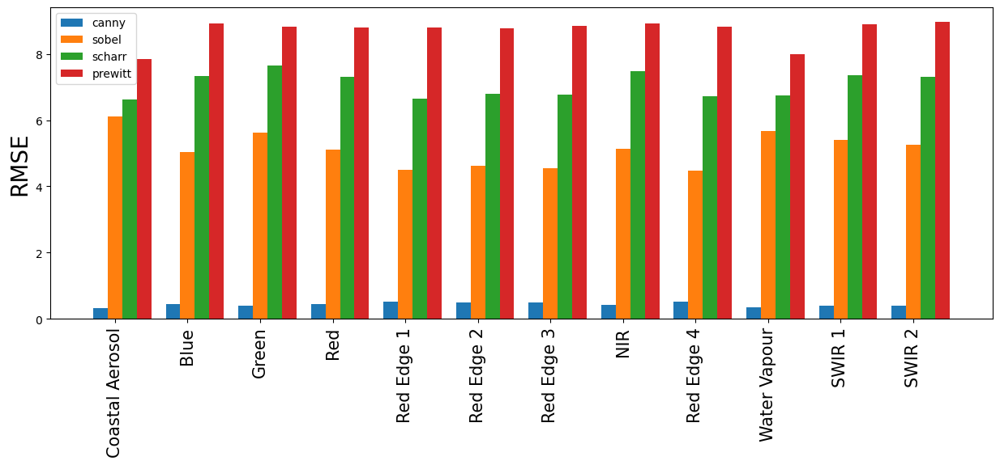

Cleaned DataFrame for metric psnr:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band       psnr
0   canny     1  58.257619
1   canny     2  55.382803
2   canny     3  56.469273
3   canny     4  55.293966
4   canny     5  53.986007
5   canny     6  54.212533
6   canny     7  54.240853
7   canny     8  55.606697
8   ca

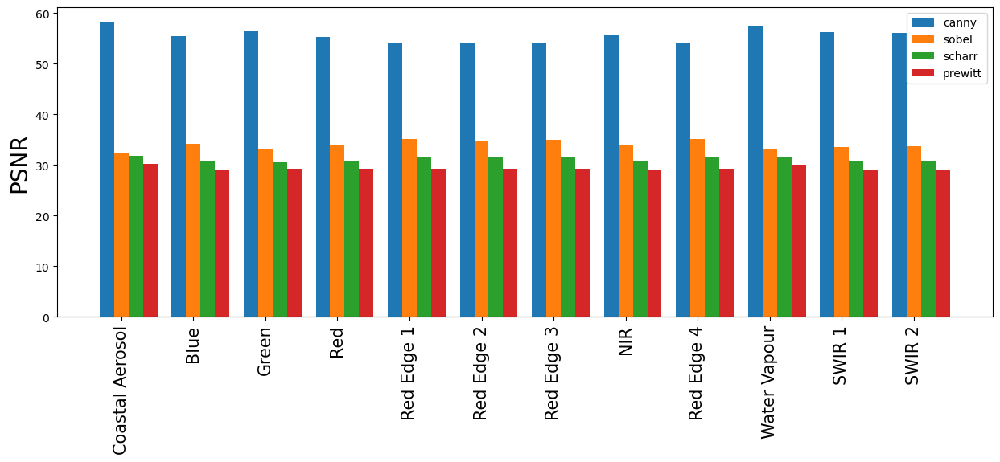

Cleaned DataFrame for metric uqi:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band       uqi
0   canny     1  0.263148
1   canny     2  0.118911
2   canny     3  0.155791
3   canny     4  0.115570
4   canny     5  0.084668
5   canny     6  0.090160
6   canny     7  0.090431
7   canny     8  0.124099
8   canny     9 

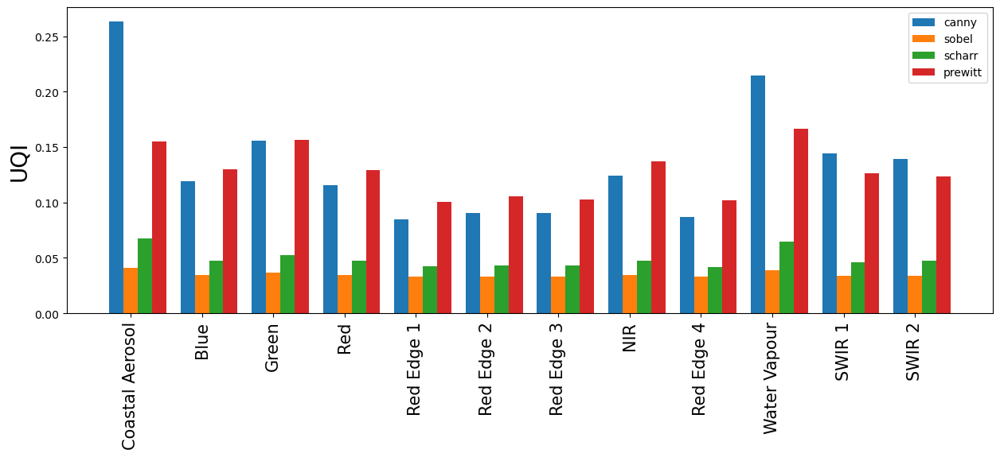

Cleaned DataFrame for metric ssim:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band      ssim
0   canny     1  0.486527
1   canny     2  0.275376
2   canny     3  0.461471
3   canny     4  0.253298
4   canny     5  0.090599
5   canny     6  0.123984
6   canny     7  0.116411
7   canny     8  0.289404
8   canny     9

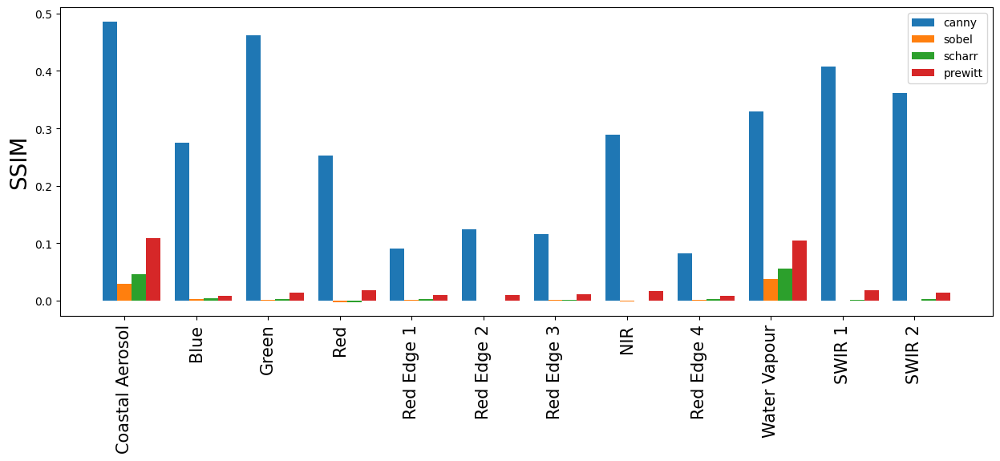

Cleaned DataFrame for metric ergas:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band       ergas
0   canny     1  361.869653
1   canny     2  503.840347
2   canny     3  444.599999
3   canny     4  509.019951
4   canny     5  591.742467
5   canny     6  576.509464
6   canny     7  574.632888
7   canny     8  491.018

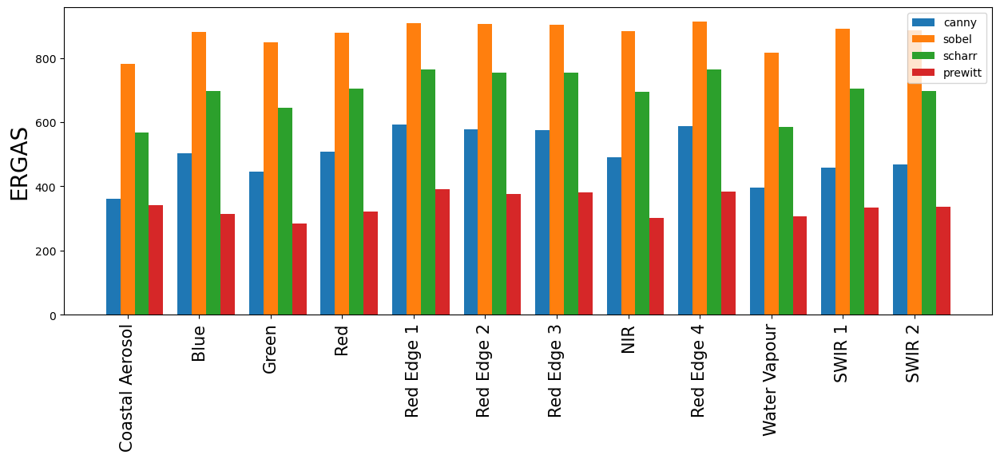

Cleaned DataFrame for metric scc:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band       scc
0   canny     1 -0.002533
1   canny     2 -0.003309
2   canny     3 -0.001335
3   canny     4 -0.003021
4   canny     5  0.002248
5   canny     6 -0.002860
6   canny     7  0.001181
7   canny     8  0.003392
8   canny     9 

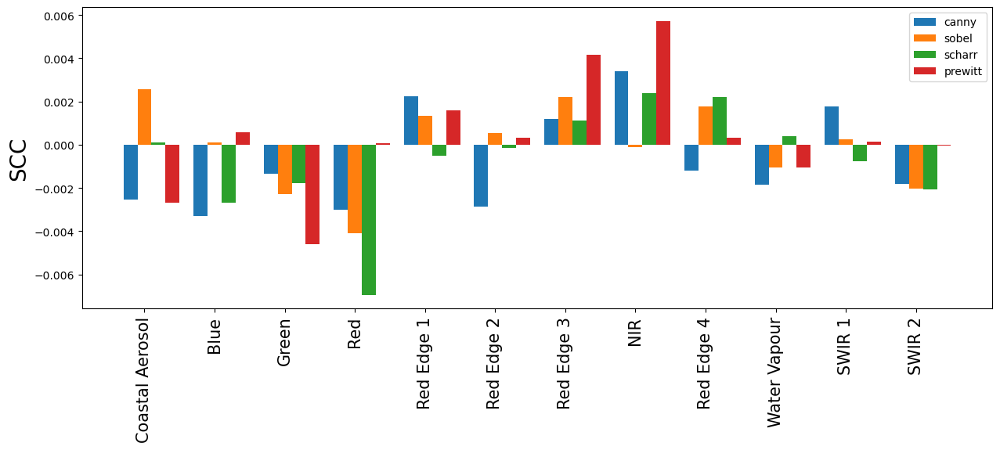

Cleaned DataFrame for metric sam:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band       sam
0   canny     1  1.496562
1   canny     2  1.455925
2   canny     3  1.450219
3   canny     4  1.446881
4   canny     5  1.461695
5   canny     6  1.474246
6   canny     7  1.467889
7   canny     8  1.437833
8   canny     9 

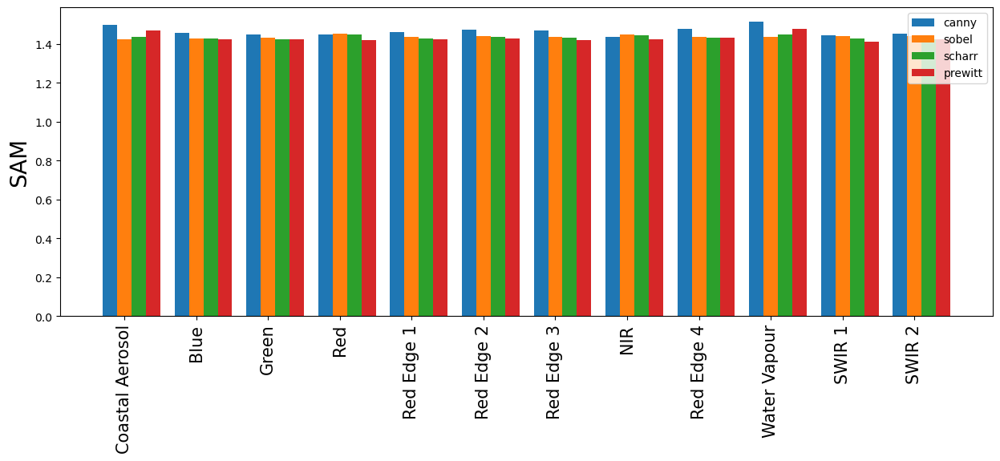

Cleaned DataFrame for metric vifp:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band      vifp
0   canny     1  0.005862
1   canny     2  0.014306
2   canny     3  0.024555
3   canny     4  0.018114
4   canny     5  0.011450
5   canny     6  0.010059
6   canny     7  0.010336
7   canny     8  0.019586
8   canny     9

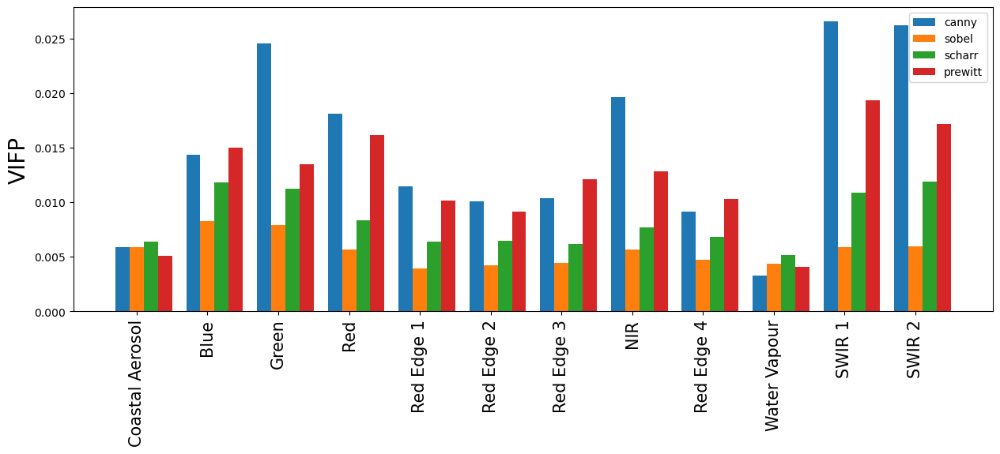

In [22]:


# Load the metrics data
df_metrics = pd.read_csv("metrics/Metrics_all.csv", index_col=0)

# Ensure that channels are defined
channels = ['Coastal Aerosol', 'Blue', 'Green', 'Red', 'Red Edge 1', 'Red Edge 2', 'Red Edge 3', 'NIR', 'Red Edge 4', 'Water Vapour', 'SWIR 1', 'SWIR 2']

# Plot the bar charts for different metrics
metrics = ['rmse', 'psnr', 'uqi', 'ssim', 'ergas', 'scc', 'sam', 'vifp']
for metric in metrics:
    metric_bar(df_metrics, metric, save=True)

Cleaned DataFrame for metric psnr:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  

Mean data for method canny:
    method  band       psnr
0   canny     1  58.257619
1   canny     2  55.382803
2   canny     3  56.469273
3   canny     4  55.293966
4   canny     5  53.986007
5   canny     6  54.212533
6   canny     7  54.240853
7   canny     8  55.606697
8   ca

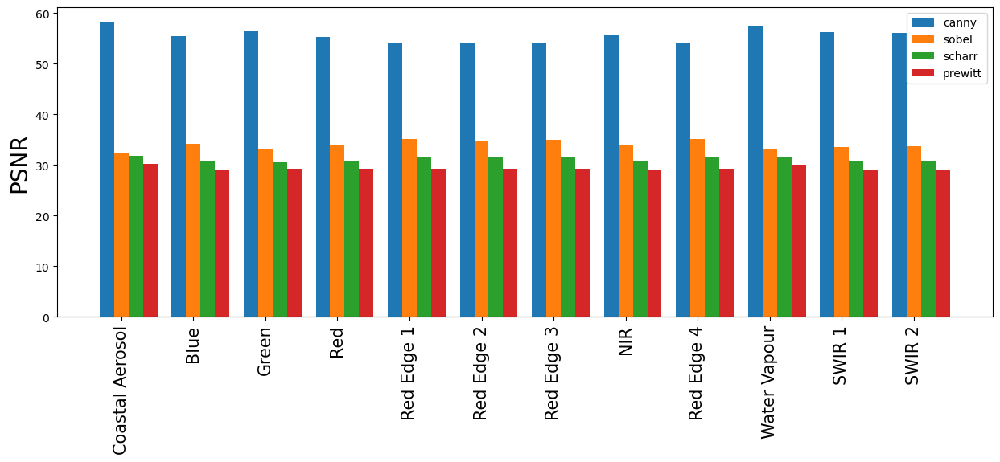

Cleaned DataFrame for metric psnr:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.357928  57.054879  0.188510  0.373820  415.613050   
1  IMG#0     1    sobel  3.849171  36.423460  0.049403  0.044432  735.318908   
2  IMG#0     1   scharr  2.285500  40.951179  0.096909  0.083567  529.702623   
3  IMG#0     1  prewitt  5.166845  33.866295  0.181392  0.126265  367.767499   
4  IMG#0     2    canny  0.313597  58.203374  0.262073  0.470673  364.136674   

        scc       sam      vifp  
0 -0.003095  1.493793  0.004403  
1 -0.001638  1.451140  0.005138  
2  0.002482  1.478253  0.005873  
3 -0.001065  1.491227  0.004333  
4 -0.003450  1.507261  0.016808  

Mean data for method canny:
    method  band       psnr
0   canny     1  57.054879
1   canny     2  58.203374
2   canny     3  60.603035
3   canny     4  59.395415
4   canny     5  58.302197
5   canny     6  58.498195
6   canny     7  57.978824
7   canny     8  59.262689
8   ca

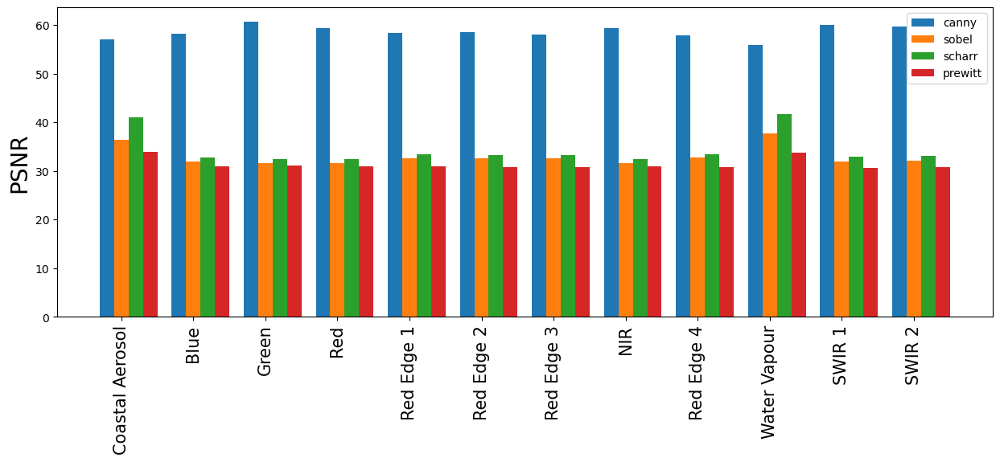

Cleaned DataFrame for metric psnr:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.317874  58.085711  0.247154  0.497458  369.102977   
1  IMG#0     1    sobel  6.396917  32.011389  0.045010  0.032184  738.960457   
2  IMG#0     1   scharr  6.443339  31.948584  0.075909  0.058878  532.220483   
3  IMG#0     1  prewitt  7.514398  30.612920  0.164882  0.168645  335.924539   
4  IMG#0     2    canny  0.359333  57.020873  0.178721  0.543791  417.243395   

        scc       sam      vifp  
0  0.001250  1.482952  0.008235  
1  0.001186  1.414348  0.006404  
2  0.000682  1.423995  0.007390  
3 -0.000496  1.460004  0.006581  
4 -0.002957  1.444020  0.033316  

Mean data for method canny:
    method  band       psnr
0   canny     1  58.085711
1   canny     2  57.020873
2   canny     3  56.936502
3   canny     4  57.285381
4   canny     5  56.578671
5   canny     6  56.601910
6   canny     7  56.634186
7   canny     8  57.097503
8   ca

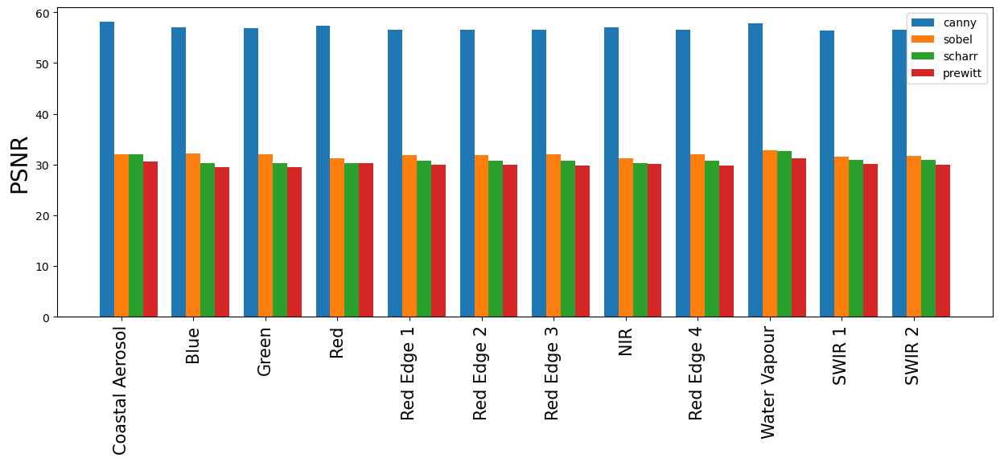

Cleaned DataFrame for metric psnr:
       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.359630  57.013693  0.186468  0.371152  417.588408   
1  IMG#0     1    sobel  3.849803  36.422033  0.049196  0.042848  737.171097   
2  IMG#0     1   scharr  2.288022  40.941598  0.096470  0.080808  530.963613   
3  IMG#0     1  prewitt  5.189278  33.828665  0.179973  0.124564  369.016821   
4  IMG#0     2    canny  0.601157  52.551052  0.060389  0.007815  698.040284   

        scc       sam      vifp  
0 -0.003091  1.493905  0.004511  
1 -0.003149  1.452482  0.005112  
2  0.002471  1.478844  0.005850  
3 -0.001056  1.491295  0.004365  
4 -0.001812  1.475560  0.004836  

Mean data for method canny:
    method  band       psnr
0   canny     1  57.013693
1   canny     2  52.551052
2   canny     3  53.177429
3   canny     4  52.744729
4   canny     5  54.241394
5   canny     6  54.428582
6   canny     7  54.417577
7   canny     8  52.745304
8   ca

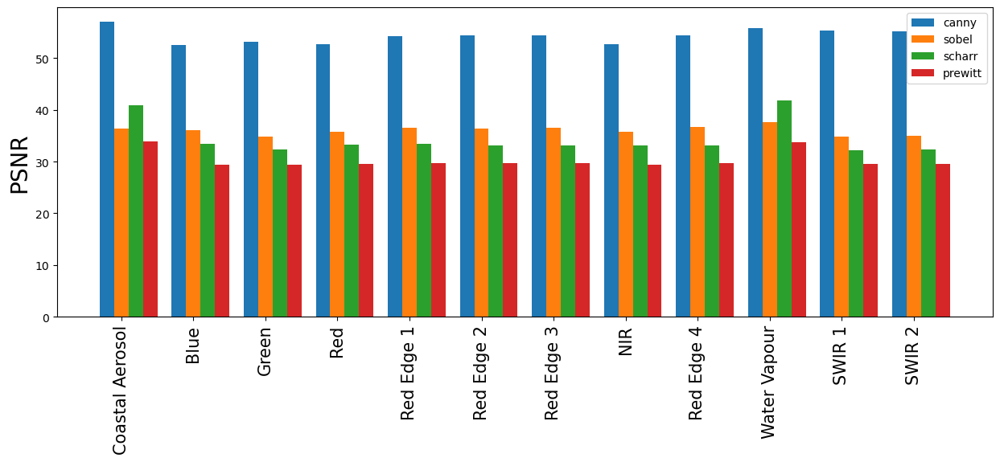

In [23]:
df_metrics = pd.read_csv("metrics/Metrics_all.csv",index_col=0)
metric_bar(df_metrics,'psnr')

df_metrics = pd.read_csv("metrics/Metrics_morph.csv",index_col=0)
metric_bar(df_metrics,'psnr')

df_metrics = pd.read_csv("metrics/Metrics_blur.csv",index_col=0)
metric_bar(df_metrics,'psnr')

df_metrics = pd.read_csv("metrics/Metrics_hist.csv",index_col=0)
metric_bar(df_metrics,'psnr')


# Figures for paper 

In [24]:
save_path = "../data/SWED/figures/{}"

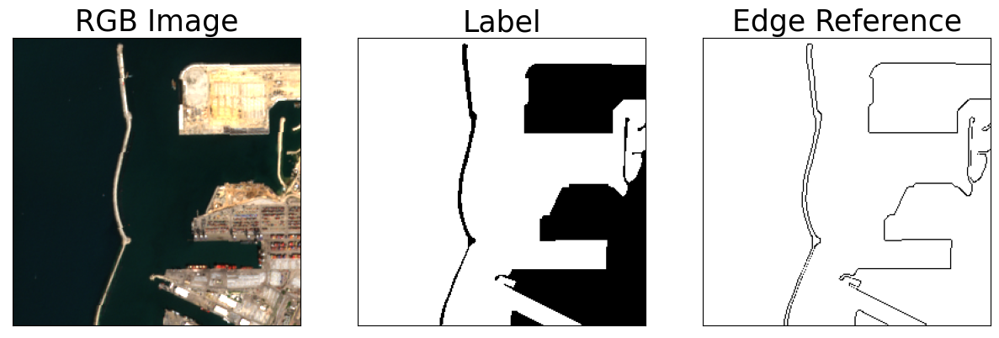

In [25]:
#Fig. 1. Example of a test image and label
#rint = 90
rint = 0
fig, axs = plt.subplots(1,3, figsize=(15,15))

axs[0].imshow(rgb[rint])
axs[0].set_title("RGB Image",size=25)

axs[1].imshow(labels[rint],cmap="gray")
axs[1].set_title("Label",size=25)

axs[2].imshow(255-edge_reference[rint],cmap="gray")
axs[2].set_title("Edge Reference",size=25)


for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.savefig(save_path.format("text_example"),bbox_inches='tight')

Selected index: 1


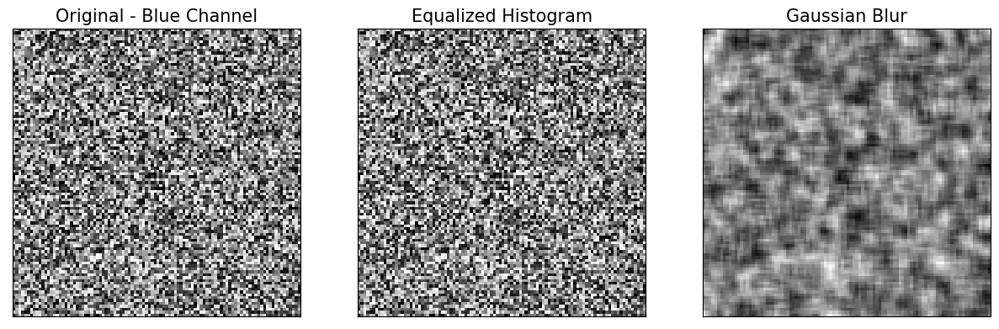

In [26]:

# Example input data (replace with your actual data)
# Ensure input has at least 3 elements for testing
input_data = [np.random.rand(100, 100, 12) for _ in range(3)]

# Save path
save_path = "../data/SWED/figures/{}"

# Select a random input index
rint = random.randint(0, len(input_data) - 1)
print(f"Selected index: {rint}")

# Get blue channel (assuming channel index 2 corresponds to blue)
img = channel_filter(input_data[rint], c=2)

# Create a figure with 3 subplots
fig, axs = plt.subplots(1, 3, figsize=(15, 15))

# Original Image
axs[0].imshow(img, cmap="gray")
axs[0].set_title("Original - Blue Channel", size=15)

# Scale bands between 0 and 255
img_scaled = cv2.normalize(img, None, 0, 255, cv2.NORM_MINMAX)
img_scaled = np.uint8(img_scaled)

# Histogram Equalization
img_eq = cv2.equalizeHist(img_scaled)
axs[1].imshow(img_eq, cmap="gray")
axs[1].set_title("Equalized Histogram", size=15)

# Gaussian Blur
kernel_size = (5, 5)
img_blur = cv2.GaussianBlur(img_eq, kernel_size, cv2.BORDER_DEFAULT)
axs[2].imshow(img_blur, cmap="gray")
axs[2].set_title("Gaussian Blur", size=15)

# Remove axis ticks
for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

# Save and display the plot
plt.savefig(save_path.format("preprocessing.png"), bbox_inches='tight')
plt.show()

4


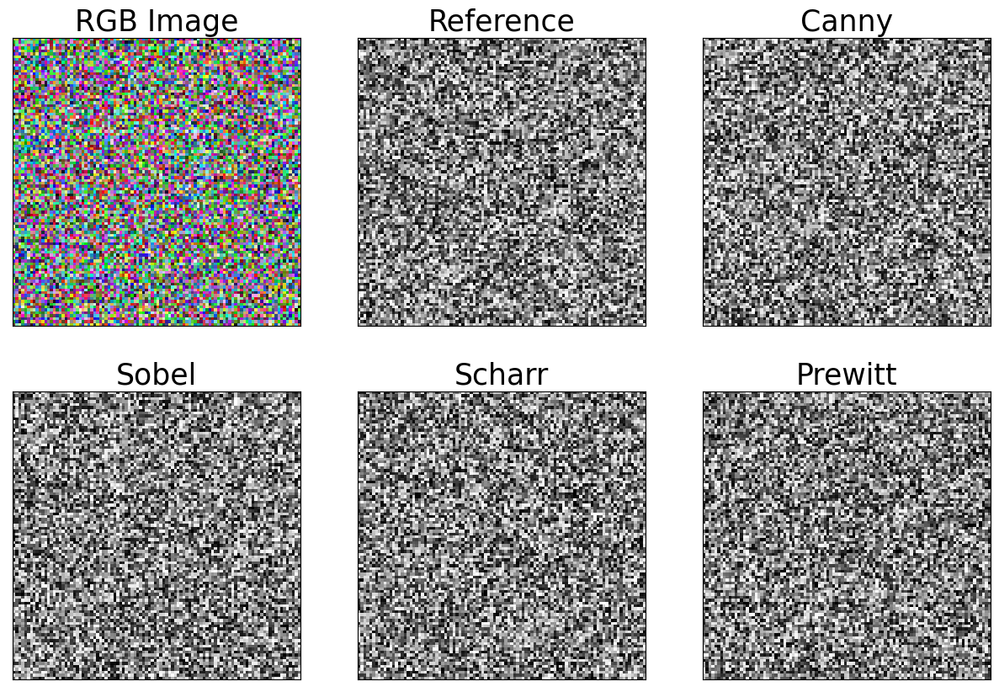

In [27]:

# Example data for testing (replace with your actual data)
# Ensure these arrays have at least 8 elements for testing
rgb = [np.random.rand(100, 100, 3) for _ in range(10)]
edge_reference = [np.random.rand(100, 100) for _ in range(10)]
canny = [np.random.rand(100, 100, 3) for _ in range(10)]
sobel = [np.random.rand(100, 100, 3) for _ in range(10)]
scharr = [np.random.rand(100, 100, 3) for _ in range(10)]
prewitt = [np.random.rand(100, 100, 3) for _ in range(10)]

# Save path
save_path = "../data/SWED/figures/{}"

# Fig. 3. Edge detection algorithms applied to blue band
rint = random.randint(0, min(len(rgb), len(edge_reference), len(canny), len(sobel), len(scharr), len(prewitt)) - 1)
print(rint)
rint = 7

channel = 1

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

axs[0, 0].imshow(rgb[rint])
axs[0, 0].set_title("RGB Image", size=25)

axs[0, 1].imshow(255 - edge_reference[rint], cmap="gray")
axs[0, 1].set_title("Reference", size=25)

axs[0, 2].imshow(255 - canny[rint][:, :, channel], cmap="gray")
axs[0, 2].set_title("Canny", size=25)

axs[1, 0].imshow(255 - sobel[rint][:, :, channel], cmap="gray")
axs[1, 0].set_title("Sobel", size=25)

axs[1, 1].imshow(255 - scharr[rint][:, :, channel], cmap="gray")
axs[1, 1].set_title("Scharr", size=25)

axs[1, 2].imshow(255 - prewitt[rint][:, :, channel], cmap="gray")
axs[1, 2].set_title("Prewitt", size=25)

for ax1 in axs:
    for ax in ax1:
        ax.set_xticks([])
        ax.set_yticks([])

plt.savefig(save_path.format("edge_detection.png"), bbox_inches='tight')
plt.show()

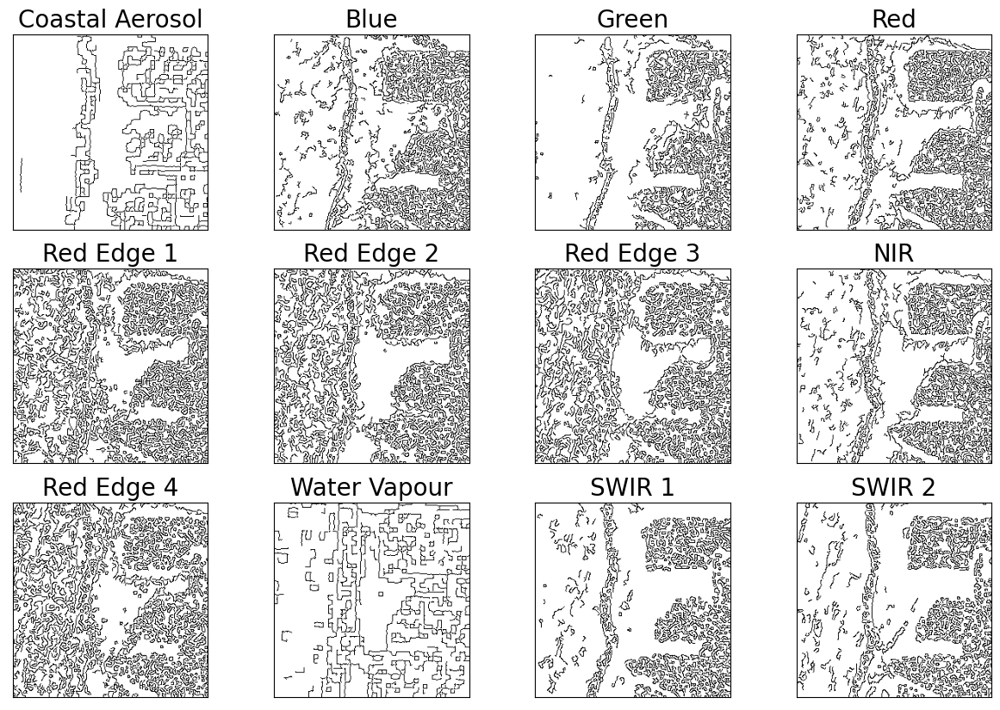

In [28]:

# Fig. 4. Image with non-coastal edges
preprocess_input = input.copy()
preprocess_input = [preprocess(img,toggle=[True,True,False]) for img in preprocess_input]

canny = [canny_ed(img) for img in preprocess_input]

rint = 0

#Fig. 5. Edge detection applied to all channels
plot_channels(canny[rint],invert=True,path=save_path.format("details_all_channels.png"))

In [29]:
#https://stackoverflow.com/questions/52337870/python-opencv-error-current-thread-is-not-the-objects-thread/72090539#72090539
#pip install opencv-python-headless
#because else jupyter notebook crashed

# Load the metrics data
df_metrics = pd.read_csv("metrics/Metrics_all.csv", index_col=0)

# Print the first few rows to check the data structure
print(df_metrics.head())

# Ensure that only numeric columns are aggregated
numeric_columns = df_metrics.select_dtypes(include=[np.number]).columns.tolist()
print("Numeric columns:", numeric_columns)

# Group by 'method' and 'band' and calculate the mean for numeric columns
mean_all = df_metrics.groupby(["method", "band"], as_index=False)[numeric_columns].mean()
print("Mean calculated.")

# Create DataFrame to store the aggregated metrics
all_stats = mean_all[mean_all["method"] == "canny"][['band', 'psnr', 'ssim']]
all_stats.columns = ['band', 'canny_psnr_mn', 'canny_ssim_mn']

print("Initial all_stats DataFrame:\n", all_stats.head())

for method in ["sobel", "scharr", "prewitt"]:
    method_stats = mean_all[mean_all["method"] == method]
    all_stats[method + "_psnr_mn"] = method_stats["psnr"].values
    all_stats[method + "_ssim_mn"] = method_stats["ssim"].values

print("Mean values added to all_stats.")

# Group by 'method' and 'band' and calculate the standard deviation for numeric columns
std_all = df_metrics.groupby(["method", "band"], as_index=False)[numeric_columns].std()
print("Standard deviation calculated.")

for method in ["canny", "sobel", "scharr", "prewitt"]:
    method_stats = std_all[std_all["method"] == method]
    all_stats[method + "_psnr_std"] = method_stats["psnr"].values
    all_stats[method + "_ssim_std"] = method_stats["ssim"].values

print("Standard deviation values added to all_stats.")

# Save to clipboard and display the DataFrame
all_stats.to_clipboard()



      ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0  IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1  IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2  IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3  IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4  IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   

        scc       sam      vifp  
0 -0.002533  1.496562  0.005862  
1  0.002571  1.423838  0.005847  
2  0.000109  1.436493  0.006398  
3 -0.002665  1.468125  0.005042  
4 -0.003309  1.455925  0.014306  
Numeric columns: ['band', 'rmse', 'psnr', 'uqi', 'ssim', 'ergas', 'scc', 'sam', 'vifp']
Mean calculated.
Initial all_stats DataFrame:
    band  canny_psnr_mn  canny_ssim_mn
0   1.0      58.257619       0.486527
1   2.0      55.382803       0.275376
2   3.0      56.469273       0.461471
3   4.0      55.293966      

       ID  band   method      rmse       psnr       uqi      ssim       ergas  \
0   IMG#0     1    canny  0.311644  58.257619  0.263148  0.486527  361.869653   
1   IMG#0     1    sobel  6.105734  32.416046  0.041248  0.029617  782.550456   
2   IMG#0     1   scharr  6.617342  31.717132  0.067392  0.045992  566.811111   
3   IMG#0     1  prewitt  7.842205  30.242040  0.155062  0.109042  340.678084   
4   IMG#0     2    canny  0.433910  55.382803  0.118911  0.275376  503.840347   
5   IMG#0     2    sobel  5.025799  34.106702  0.034416  0.003271  880.621347   
6   IMG#0     2   scharr  7.329409  30.829425  0.047438  0.003592  697.292327   
7   IMG#0     2  prewitt  8.924523  29.119103  0.130275  0.008533  314.031269   
8   IMG#0     3    canny  0.382892  56.469273  0.155791  0.461471  444.599999   
9   IMG#0     3    sobel  5.623968  33.129947  0.036324  0.000963  848.146858   
10  IMG#0     3   scharr  7.647007  30.460974  0.052764  0.002447  644.371085   
11  IMG#0     3  prewitt  8.

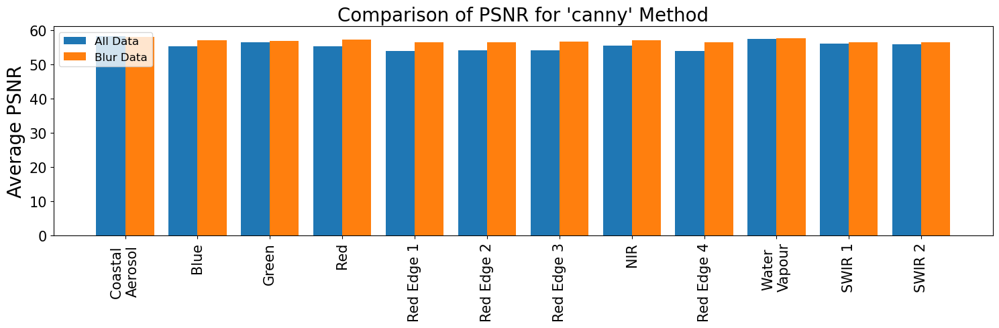

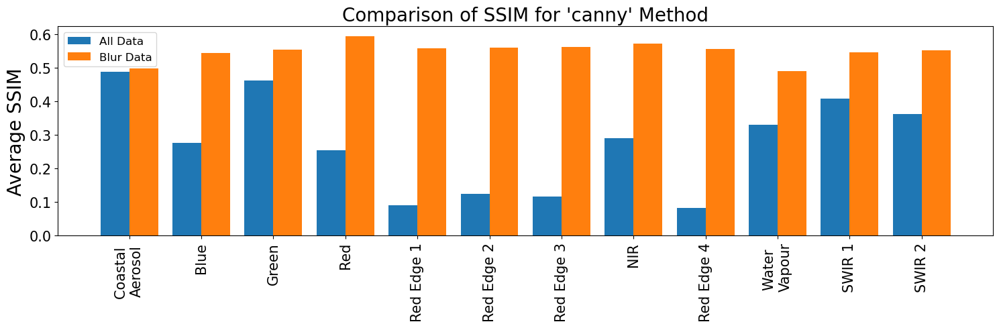

In [30]:


# Load your data
df_all = pd.read_csv("metrics/Metrics_all.csv", index_col=0)

print(df_all)

# Define numeric columns
numeric_columns = ['psnr', 'ssim']  # Add other numeric columns if needed

# Check for non-numeric values in numeric columns
for col in numeric_columns:
    non_numeric_rows = df_all[pd.to_numeric(df_all[col], errors='coerce').isnull()]
    if not non_numeric_rows.empty:
        print(f"Non-numeric values in {col}:")
        print(non_numeric_rows)

# Convert numeric columns to float, coercing errors to NaN
df_all[numeric_columns] = df_all[numeric_columns].apply(pd.to_numeric, errors='coerce')

# Drop rows with NaN values in numeric columns
df_all = df_all.dropna(subset=numeric_columns)

print("Drop rows with NaN values in numeric columns")
print(df_all)

# Debugging: Check the data for 'canny' method
print("Data for 'canny' method:\n", df_all[df_all['method'] == 'canny'])

# Now perform your groupby operations for 'canny' method
# Filter out non-numeric columns
numeric_columns = df_all.select_dtypes(include=[np.number]).columns

# Group by 'method' and 'band' and calculate mean for numeric columns
mean_all = df_all[df_all.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].mean()

print("mean_all")
print(mean_all)
sd_all = df_all[df_all.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].std()
print("sd_all")
print(sd_all)

# Ensure no NaN values in the standard deviation data
sd_all = sd_all.fillna(0)
print("new sd_all")
print(sd_all)

# Load data from Metrics_blur.csv and Metrics_morph.csv if needed
df_blur = pd.read_csv("metrics/Metrics_blur.csv", index_col=0)
df_morph = pd.read_csv("metrics/Metrics_morph.csv", index_col=0)

# Calculate mean and standard deviation for 'canny' method grouped by 'method' and 'band' for df_blur and df_morph
mean_blur = df_blur[df_blur.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].mean()
sd_blur = df_blur[df_blur.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].std()

mean_morph = df_morph[df_morph.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].mean()
sd_morph = df_morph[df_morph.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].std()

# Ensure no NaN values in the standard deviation data for blur and morph
sd_blur = sd_blur.fillna(0)
sd_morph = sd_morph.fillna(0)

# Define bands and corresponding channel names
bands = mean_all['band']
channels_ = ['Coastal \nAerosol', 'Blue', 'Green',
             'Red', 'Red Edge 1', 'Red Edge 2',
             'Red Edge 3', 'NIR', 'Red Edge 4',
             'Water \nVapour', 'SWIR 1', 'SWIR 2']

# Plot for 'psnr' metric
w = 0.4
metric = 'psnr'
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
plt.bar(bands - w/2, mean_all[metric], yerr=sd_all[metric], width=w, label='All Data')
plt.bar(bands + w/2, mean_blur[metric], yerr=sd_blur[metric], width=w, label='Blur Data')

plt.ylabel("Average " + metric.upper(), fontsize=20)
plt.xticks(ticks=range(1, 13), labels=channels_, fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.legend(loc='upper left', fontsize=12)
plt.title(f"Comparison of {metric.upper()} for 'canny' Method", fontsize=20)
plt.tight_layout()
plt.savefig("psnr_comparison.png")

# Plot for 'ssim' metric
w = 0.4
metric = 'ssim'
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
plt.bar(bands - w/2, mean_all[metric], yerr=sd_all[metric], width=w, label='All Data')
plt.bar(bands + w/2, mean_blur[metric], yerr=sd_blur[metric], width=w, label='Blur Data')

plt.ylabel("Average " + metric.upper(), fontsize=20)
plt.xticks(ticks=range(1, 13), labels=channels_, fontsize=15, rotation=90)
plt.yticks(fontsize=15)
plt.legend(loc='upper left', fontsize=12)
plt.title(f"Comparison of {metric.upper()} for 'canny' Method", fontsize=20)
plt.tight_layout()
plt.savefig("ssim_comparison.png")

plt.show()



mean_none:    method  band      rmse       psnr       uqi      ssim       ergas  \
0   canny   1.0  0.359630  57.013693  0.186468  0.371152  417.588408   
1   canny   2.0  0.601157  52.551052  0.060389  0.007815  698.040284   
2   canny   3.0  0.559331  53.177429  0.069907  0.057811  649.473845   
3   canny   4.0  0.587900  52.744729  0.063223  0.027808  682.647730   
4   canny   5.0  0.494846  54.241394  0.091558  0.040122  574.597085   
5   canny   6.0  0.484296  54.428582  0.096143  0.055691  562.346532   
6   canny   7.0  0.484910  54.417577  0.095849  0.044186  563.059486   
7   canny   8.0  0.587861  52.745304  0.063073  0.021041  682.602522   
8   canny   9.0  0.488047  54.361574  0.095100  0.025244  566.701565   
9   canny  10.0  0.412382  55.824802  0.138117  0.151558  478.842839   
10  canny  11.0  0.433559  55.389848  0.121911  0.163433  503.431850   
11  canny  12.0  0.446476  55.134841  0.114799  0.149585  518.431100   

         scc       sam      vifp  
0  -0.003091  1.4

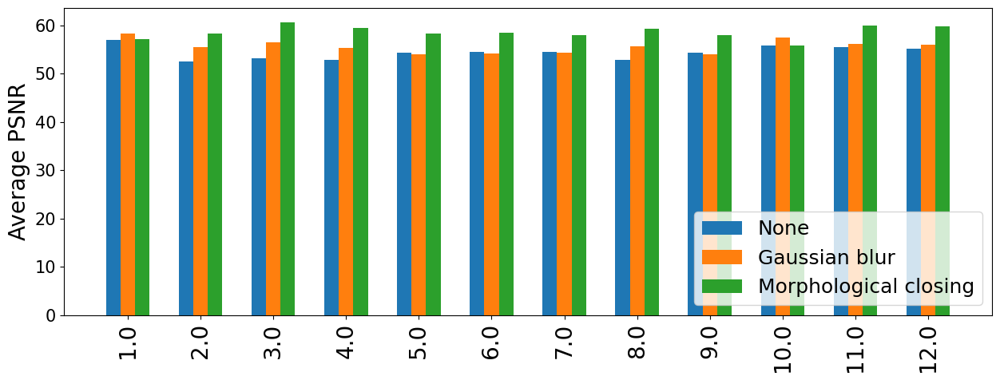

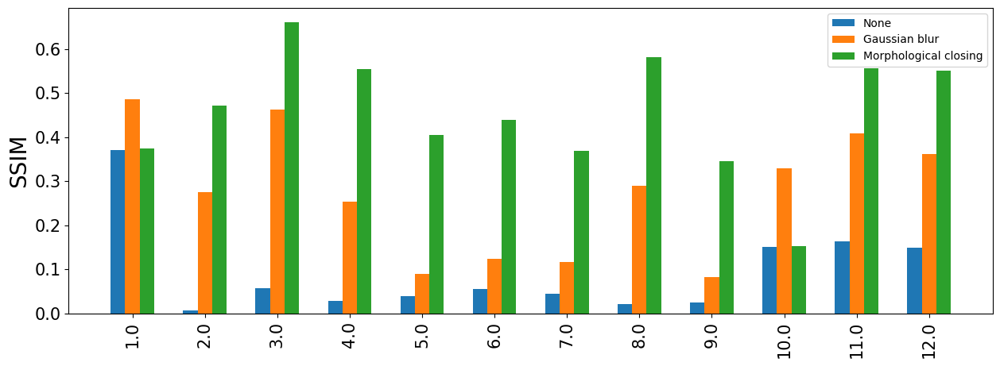

In [31]:
#Fig. 10. Average PSNR for canny edge detection using different noise reduction methods

# Read the data
# Read the data
df_hist = pd.read_csv("metrics/Metrics_hist.csv", index_col=0) # no noise reduction
df_all = pd.read_csv("metrics/Metrics_all.csv", index_col=0)   # blur
df_morph = pd.read_csv("metrics/Metrics_morph.csv", index_col=0) # morph

# Select numeric columns
numeric_columns_hist = df_hist.select_dtypes(include=[np.number]).columns
numeric_columns = df_all.select_dtypes(include=[np.number]).columns
numeric_columns_morph = df_morph.select_dtypes(include=[np.number]).columns

# Calculate mean and standard deviation
mean_none = df_hist[df_hist.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns_hist].mean()
sd_none = df_hist[df_hist.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns_hist].std()

mean_blur = df_all[df_all.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].mean()
sd_blur = df_all[df_all.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns].std()

mean_morph = df_morph[df_morph.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns_morph].mean()
sd_morph = df_morph[df_morph.method == 'canny'].groupby(["method", "band"], as_index=False)[numeric_columns_morph].std()

# Replace NaN values in standard deviations with zeros
sd_none = sd_none.fillna(0)
sd_blur = sd_blur.fillna(0)
sd_morph = sd_morph.fillna(0)

# Print debug information
print("mean_none:", mean_none)
print("sd_none:", sd_none)
print("mean_blur:", mean_blur)
print("sd_blur:", sd_blur)
print("mean_morph:", mean_morph)
print("sd_morph:", sd_morph)

# Plot
bands = mean_none['band']
w = 0.4
metric = 'psnr'

fig, ax = plt.subplots(1, 1, figsize=(15, 5))
plt.bar(bands - w / 2, mean_none[metric], yerr=sd_none[metric], width=w / 2, label='None')
plt.bar(bands, mean_blur[metric], yerr=sd_blur[metric], width=w / 2, label='Gaussian blur')
plt.bar(bands + w / 2, mean_morph[metric], yerr=sd_morph[metric], width=w / 2, label='Morphological closing')

plt.ylabel("Average " + metric.upper(), fontsize=20)
plt.xticks(ticks=range(1, 13), labels=bands, fontsize=20, rotation=90)
plt.yticks(fontsize=15)

plt.legend(loc=4, fontsize=18)
plt.show()

# Plot for SSIM
metric = 'ssim'
fig, ax = plt.subplots(1, 1, figsize=(15, 5))
plt.bar(bands - w / 2, mean_none[metric], yerr=sd_none[metric], width=w / 2, label='None')
plt.bar(bands, mean_blur[metric], yerr=sd_blur[metric], width=w / 2, label='Gaussian blur')
plt.bar(bands + w / 2, mean_morph[metric], yerr=sd_morph[metric], width=w / 2, label='Morphological closing')

plt.ylabel(metric.upper(), fontsize=20)
plt.xticks(ticks=range(1, 13), labels=bands, fontsize=15, rotation=90)
plt.yticks(fontsize=15)

plt.legend()
plt.show()

# Archive

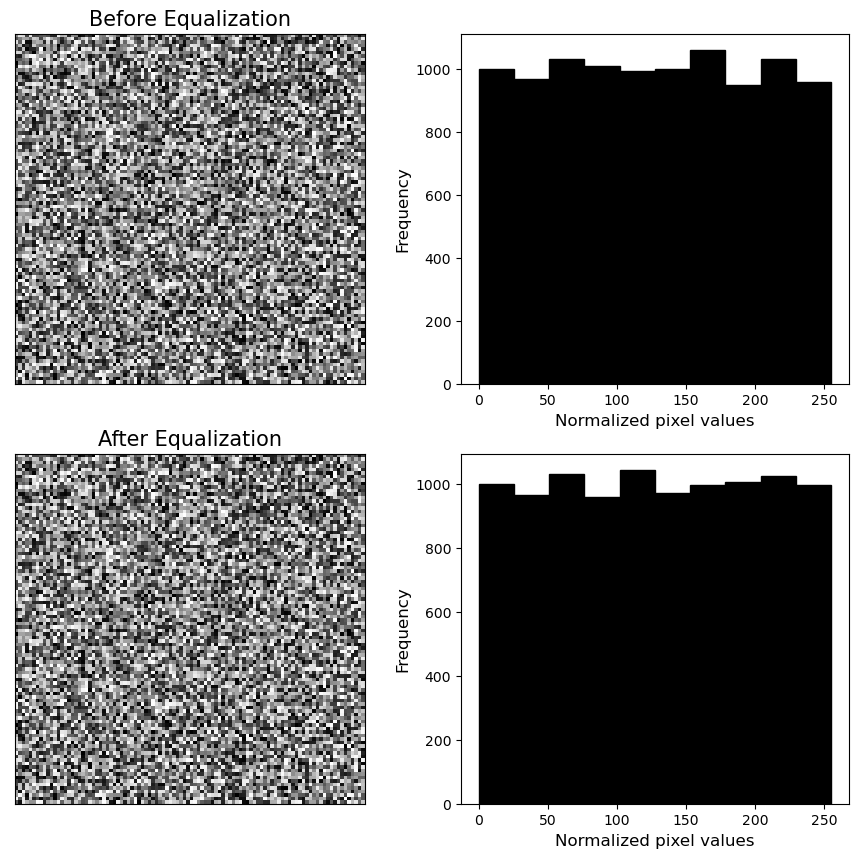

In [32]:
# Ensure input has at least 61 elements for testing
input_data = [np.random.rand(100, 100, 12) for _ in range(61)]

# Save path
save_path = "../data/SWED/figures/{}"

# Select a random input index
rint = 60

# Check if rint is within the bounds of input_data
if rint >= len(input_data):
    raise IndexError(f"Index {rint} is out of range for input with length {len(input_data)}")

# Before equalization
blue = channel_filter(input_data[rint], 1)
blue = cv2.normalize(blue, None, 0, 255, cv2.NORM_MINMAX, cv2.CV_8U)

fig, axs = plt.subplots(2, 2, figsize=(11, 10))

axs[0, 0].imshow(blue, cmap="gray")
axs[0, 0].set_xticks([])
axs[0, 0].set_yticks([])
axs[0, 0].set_title("Before Equalization", size=15)

axs[0, 1].hist(blue.ravel(), fc='k', ec='k')
axs[0, 1].set_xlabel("Normalized pixel values", size=12)
axs[0, 1].set_ylabel("Frequency", size=12)

# After equalization
blue_hist = cv2.equalizeHist(blue)
axs[1, 0].imshow(blue_hist, cmap="gray")
axs[1, 0].set_xticks([])
axs[1, 0].set_yticks([])
axs[1, 0].set_title("After Equalization", size=15)

axs[1, 1].hist(blue_hist.ravel(), fc='k', ec='k')
axs[1, 1].set_xlabel("Normalized pixel values", size=12)
axs[1, 1].set_ylabel("Frequency", size=12)

plt.savefig(save_path.format("histogram_equalization.png"), bbox_inches='tight')
plt.show()


In [33]:

# Assuming edge_reference is defined and contains the reference edge images
edge_reference = [np.random.rand(100, 100, 12) for _ in range(3)]

# Example input data (replace with your actual data)
input_data = [np.random.rand(100, 100, 12) for _ in range(3)]

# Thresholding and preprocessing experiments 
thresholds = [[50, 100], [50, 150], [100, 200], [100, 300], [200, 400], [200, 600]]
toggles = [[True, True, False]]

rows = []

for toggle in toggles:
    print(toggle)
    preprocess_input = [preprocess(img, toggle=toggle) if img is not None else None for img in input_data]

    for threshold in thresholds:
        print(threshold)

        t1 = threshold[0]
        t2 = threshold[1]
        
        canny = []
        for img in preprocess_input:
            if img is not None:
                canny_edges = canny_ed(img, threshold1=t1, threshold2=t2)
                canny.append(canny_edges)
            else:
                canny.append(None)

        for i in range(len(edge_reference)):
            ref_img = edge_reference[i]
            ID = "IMG#{}".format(i)
            
            for j in range(12):
                if canny[i] is not None:
                    img = canny[i][:, :, j]
                else:
                    img = np.zeros_like(ref_img[:, :, j])
                
                rmse_ = rmse(ref_img[:, :, j], img)
                psnr_ = psnr(ref_img[:, :, j], img)
                uqi_ = uqi(ref_img[:, :, j], img)
                ssim_ = ssim(ref_img[:, :, j], img, data_range=img.max() - img.min(), multichannel=False)
                """ergas_ = ergas(ref_img, img)
                scc_ = scc(ref_img, img)
                sam_ = sam(ref_img, img)
                vifp_ = vifp(ref_img, img)"""

                row = [ID, str(threshold), str(toggle), j + 1, rmse_, psnr_, uqi_, ssim_]
                rows.append(row)

df_metrics = pd.DataFrame(rows, columns=['ID', "thresholds", "toggle", "band", "rmse", "psnr", "uqi", "ssim"])
df_metrics.to_csv("metrics/Metrics_canny.csv")
df_metrics.head()


[True, True, False]
[50, 100]
[50, 150]
[100, 200]
[100, 300]
[200, 400]
[200, 600]


,ID,thresholds,toggle,band,rmse,psnr,uqi,ssim
0,IMG#0,"[50, 100]","[True, True, False]",1,0.574097,52.951102,0,0.0
1,IMG#0,"[50, 100]","[True, True, False]",2,0.576267,52.918330,0,0.0
2,IMG#0,"[50, 100]","[True, True, False]",3,0.579258,52.873359,0,0.0
3,IMG#0,"[50, 100]","[True, True, False]",4,0.582269,52.828329,0,0.0
4,IMG#0,"[50, 100]","[True, True, False]",5,0.576085,52.921076,0,0.0


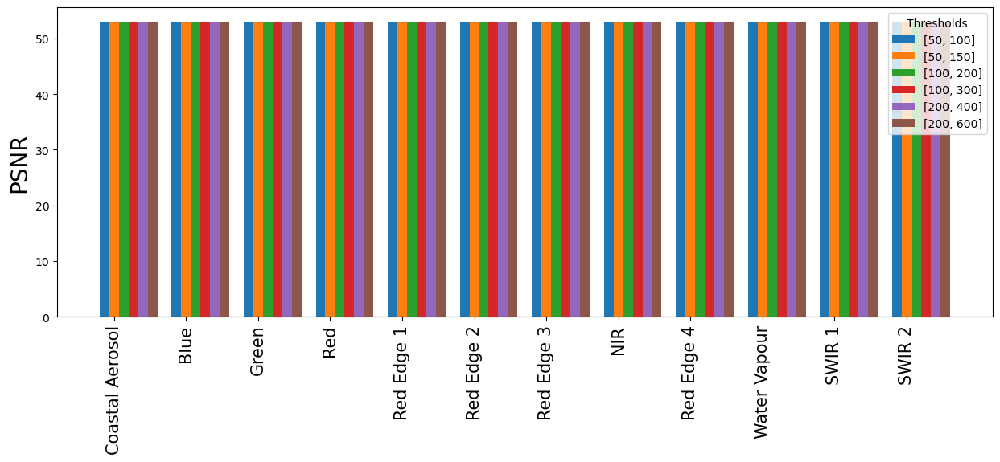

In [34]:
numeric_columns_metrics = df_metrics.select_dtypes(include=[np.number]).columns

mean =  df_metrics[df_metrics.toggle=="[True, True, False]"].groupby(["thresholds","band"],as_index=False)[numeric_columns_metrics].mean()
sd =  df_metrics[df_metrics.toggle=="[True, True, False]"].groupby(["thresholds","band"],as_index=False)[numeric_columns_metrics].std()
metric = "psnr"
global channels

thresholds = [[50,100],[50,150],[100,200],[100,300],[200,400],[200,600]]
toggles = [[True,False,False],[True,True,False],[True,False,True],[True,True,True]]


fig,ax = plt.subplots(1,1,figsize=(15,5))

w = 0.4
for i,thresh in enumerate(thresholds):

    bands = mean[mean.thresholds==str(thresh)]["band"]

    mean_i = mean[mean.thresholds==str(thresh)][metric]
    sd_i = sd[sd.thresholds==str(thresh)][metric]
    
    plt.bar(bands-w/3+i*w/3,mean_i,yerr=sd_i,width=w/3,label=str(thresh))

plt.ylabel(metric.upper(),fontsize=20)
plt.xticks(ticks=range(1,13),labels= channels,fontsize=15, rotation=90)

plt.legend(title="Thresholds")


List size: 100
11


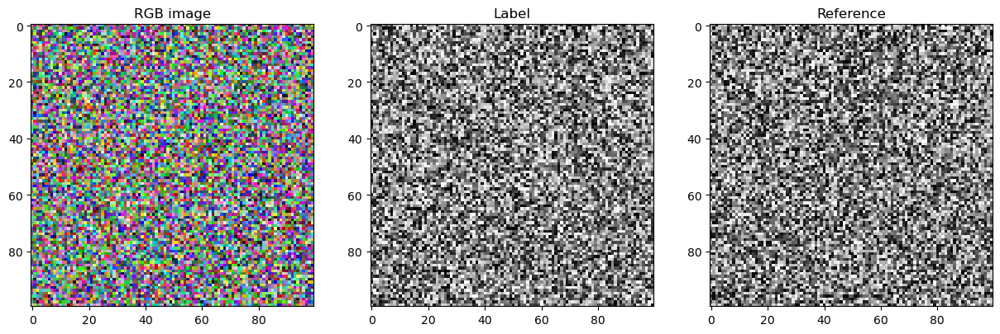

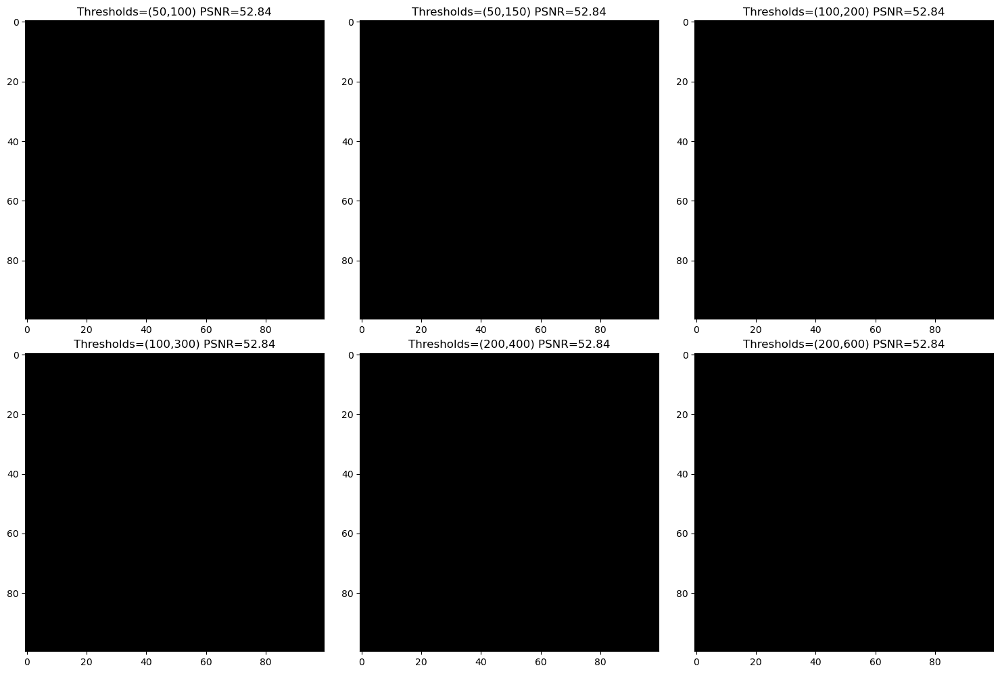

In [35]:
# Ensure that rgb, labels, and edge_reference are defined and have the same length
# Example definition for these variables, replace with your actual data
rgb = [np.random.rand(100, 100, 3) for _ in range(100)]  # List of 100 RGB images
labels = [np.random.rand(100, 100) for _ in range(100)]  # List of 100 labels
edge_reference = [np.random.rand(100, 100, 12) for _ in range(100)]  # List of 100 edge reference images

# Ensure preprocess_input also has the same length
preprocess_input = [np.random.rand(100, 100, 12) for _ in range(100)]  # List of 100 preprocessed images

# Check the length of the lists
list_size = min(len(rgb), len(labels), len(edge_reference), len(preprocess_input))
print(f"List size: {list_size}")

# Select a random index within the bounds of the list sizes
rint = random.randint(0, list_size - 1)
print(rint)

# For demonstration, set rint to a known value for repeatability
rint = 48

fig, axs = plt.subplots(1, 3, figsize=(15, 15))

axs[0].imshow(rgb[rint])
axs[0].set_title("RGB image")

axs[1].imshow(labels[rint], cmap="gray")
axs[1].set_title("Label")

axs[2].imshow(255 - edge_reference[rint][:, :, 1], cmap="gray")
axs[2].set_title("Reference")

thresholds = [[50, 100], [50, 150], [100, 200], [100, 300], [200, 400], [200, 600]]

fig, axs = plt.subplots(2, 3, figsize=(15, 10))

for i, ax in enumerate(axs.flatten()):
    t1 = thresholds[i][0]
    t2 = thresholds[i][1]
    canny = canny_ed(preprocess_input[rint], t1, t2)[:, :, 1]
    psnr_ = psnr(edge_reference[rint][:, :, 1], canny)
    ax.imshow(255 - canny, cmap="gray")
    ax.set_title(f"Thresholds=({t1},{t2}) PSNR={psnr_:.2f}")

plt.tight_layout()
plt.show()

List size: 100
22
2.850585850922016e-06 0.9999897968260596
0.0 0.0
0.0 0.0
0.0 0.0


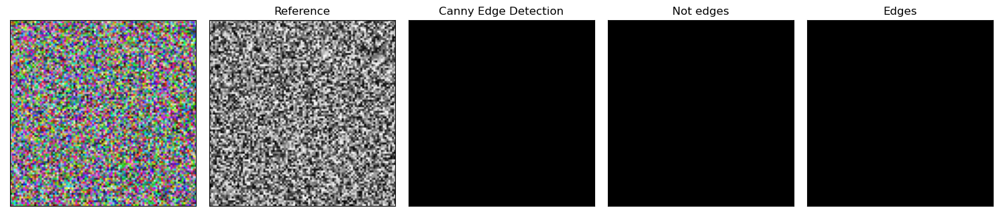

In [36]:

# Example definitions for these variables, replace with your actual data
rgb = [np.random.rand(100, 100, 3) for _ in range(100)]  # List of 100 RGB images
labels = [np.random.rand(100, 100) for _ in range(100)]  # List of 100 labels
edge_reference = [np.random.rand(100, 100, 12) for _ in range(100)]  # List of 100 edge reference images
preprocess_input = [np.random.rand(100, 100, 12) for _ in range(100)]  # List of 100 preprocessed images

# Ensure lists are of the same size
list_size = min(len(rgb), len(labels), len(edge_reference), len(preprocess_input))
print(f"List size: {list_size}")

# Select a random index within the bounds of the list sizes
rint = random.randint(0, list_size - 1)
print(rint)

# Preprocess input images
preprocess_input = [preprocess(img, toggle=[True, True, False]) for img in preprocess_input]

r = edge_reference[rint] * 1.0
print(r.min(), r.max())

c = 2
canny = canny_ed(preprocess_input[rint])[:, :, c] * 1.0
print(canny.min(), canny.max())

non_edge = np.array(canny) - np.array(r[:, :, c])
non_edge = np.clip(non_edge, 0, 255)
print(non_edge.min(), non_edge.max())

edge = np.clip(non_edge, 0, 255) - np.array(canny)
print(edge.min(), edge.max())

fig, axs = plt.subplots(1, 5, figsize=(15, 15))

axs[0].imshow(rgb[rint])

axs[1].imshow(255 - r[:, :, c], cmap="gray")
axs[1].set_title("Reference")

axs[2].imshow(255 - canny, cmap="gray")
axs[2].set_title("Canny Edge Detection")

axs[3].imshow(255 - non_edge, cmap="gray")
axs[3].set_title("Not edges")

axs[4].imshow(edge, cmap="gray")
axs[4].set_title("Edges")

for ax in axs:
    ax.set_xticks([])
    ax.set_yticks([])

plt.tight_layout()
plt.show()
